This file requires the following excel and h5 files:
1. warrior2_all_train_keypoints
2. tree_all_train_keypoints
3.
4.
5. test_keypoints
6. image_data_train1
7. image_data_test1


#Loading libraries

In [ ]:
!pip install mediapipe

In [ ]:
import cv2
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import mediapipe as mp
import json


In [ ]:
# prompt: connect to drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Functions

##Extracting keypoints from folders

In [ ]:
# Initialize Mediapipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# Function to extract keypoints from an image
# Function to extract keypoints from an image
def extract_keypoints(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)

    keypoints = {}

    if results.pose_landmarks:
        for idx, landmark in enumerate(results.pose_landmarks.landmark):
            keypoints[mp_pose.PoseLandmark(idx).name] = {
                'x': landmark.x,
                'y': landmark.y,
                'z': landmark.z
            }

    return keypoints

# Function to process images from a root directory and its subfolders
def process_images_from_subfolders(root_directory):
    all_keypoints = []

    for dirpath, _, filenames in os.walk(root_directory):
        # Assume the directory name represents the label
        label = os.path.basename(dirpath)

        for filename in filenames:
            if filename.endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(dirpath, filename)
                image = cv2.imread(image_path)

                keypoints = extract_keypoints(image)

                # Flatten the keypoints for CSV
                keypoint_row = {'image_path': image_path, 'label': label}
                for landmark_name, coords in keypoints.items():
                    keypoint_row[f'{landmark_name}_x'] = coords['x']
                    keypoint_row[f'{landmark_name}_y'] = coords['y']
                    keypoint_row[f'{landmark_name}_z'] = coords['z']

                all_keypoints.append(keypoint_row)

    return all_keypoints

# Function to save keypoints to CSV
def save_keypoints_to_csv(keypoints, filename):
    df = pd.DataFrame(keypoints)
    df.to_csv(filename, index=False)
    # return df

##Extracting keypoints from image in an image_path

In [ ]:
def extract_keypoints(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)

    keypoints = {}

    if results.pose_landmarks:
        for idx, landmark in enumerate(results.pose_landmarks.landmark):
            keypoints[mp_pose.PoseLandmark(idx).name] = {
                'x': landmark.x,
                'y': landmark.y,
                'z': landmark.z
            }

    return keypoints

def extract(image_path):
    all_keypoints = []
    filename = image_path
    if filename.endswith(('.png', '.jpg', '.jpeg')):
        image = cv2.imread(image_path)
    label = image_path.split('.')[0]

    keypoints= extract_keypoints(image)

    # Flatten the keypoints for CSV
    keypoint_row = {'label': label}
    for landmark_name, coords in keypoints.items():
        keypoint_row[f'{landmark_name}'] = (coords['x'], coords['y'], coords['z'])

    all_keypoints.append(keypoint_row)

    return all_keypoints

Ideal

In [ ]:
def extract_ideal(image_paths):
  ideal_keypoints = extract(image_paths[0])[0]
  del ideal_keypoints['label']
  ideal_keypoints.keys()
  return ideal_keypoints

In [ ]:
##Example Usage
# image_paths = ["tree_ideal.jpg"]
# ideal_keypoints = extract_ideal(image_paths)

Detected

In [ ]:
##Example Usage
# image_paths = ["tree_detected.jpg"]
# detected_keypoints = extract_ideal(image_paths)

Ideal flipped

In [ ]:
def extract_ideal_flipped(image_paths):
  ls = []
  for image_path in image_paths:
    image =cv2.imread(image_path)
    ls.append(cv2.flip(image, 1))
  l = ls[0]
  cv2.imwrite('flipped_tree_ideal.jpg', l)
  image_paths = ["flipped_tree_ideal.jpg"]
  ideal_keypoints_flipped = extract(image_paths[0])[0]
  #save_keypoints_to_csv(keypoints_data, 'warrior2_train.csv')
  del ideal_keypoints_flipped['label']
  ideal_keypoints_flipped.keys()
  return ideal_keypoints_flipped

In [ ]:
##Example Usage
# image_paths = ["tree_ideal.jpg"]
# ideal_flipped_keypoints = extract_ideal(image_paths)

##Calculating angle

In [ ]:
# prompt: use pose connections to measure the angles between
#x co-ordinates of various joints for a yoga pose in ideal keypoints

import math

def calculate_angle(a, b, c):
  """Calculates the angle between three points (a, b, c)."""
  a = np.array(a) # Convert to numpy arrays
  b = np.array(b)
  c = np.array(c)
  ba = a - b
  bc = c - b
  cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
  angle = np.arccos(cosine_angle)
  return np.degrees(angle)



In [ ]:
def calculate_angles_joints(keypoints):
  angles_ = []
  angles_dict = {}
  for connection in pose_connections:
      try:
          joint1_name, joint2_name, joint3_name = connection
          joint1 = [keypoints[joint1_name][0], keypoints[joint1_name][1]]
          joint2 = [keypoints[joint2_name][0], keypoints[joint2_name][1]]
          joint3 = [keypoints[joint3_name][0], keypoints[joint3_name][1]]
          angle = calculate_angle(joint1, joint2, joint3)
          angles_.append(angle)
          angles_dict[f"{joint1_name}-{joint2_name}-{joint3_name}"] = angle
          print(f"Angle between {joint1_name}, {joint2_name}, and {joint3_name}: {angle:.2f} degrees")
      except KeyError as e:
          print(f"Warning: Could not calculate angle due to missing keypoint: {e}")
      except Exception as e:
        print(f"An error occurred: {e}")
  return angles_, angles_dict

In [ ]:
##Example usage
# angles_ideal, angles_ideal_dict =calculate_angles_joints(ideal_keypoints)
# angles_detected, angles_detected_dict= calculate_angles_joints(detected_keypoints)
# angles_ideal_flipped, angles_ideal_flipped_dict= calculate_angles_joints(ideal_flipped_keypoints)

##Visualising angles between joints- for two images

In [ ]:
# prompt: function to visualise the joints and the angles in ideal_keypoints

import matplotlib.pyplot as plt

def visualize_joints_and_angles(ideal_keypoints, detected_keypoints, pose_connections):
    """Visualizes the joints and angles for ideal and detected poses."""

    plt.figure(figsize=(12, 6))

    # Plot ideal pose
    plt.subplot(1, 2, 1)
    plt.title("Ideal Pose")
    for connection in pose_connections:
        try:
            joint1_name, joint2_name, joint3_name = connection
            joint1 = [ideal_keypoints[joint1_name][0], ideal_keypoints[joint1_name][1]]
            joint2 = [ideal_keypoints[joint2_name][0], ideal_keypoints[joint2_name][1]]
            joint3 = [ideal_keypoints[joint3_name][0], ideal_keypoints[joint3_name][1]]

            plt.plot([joint1[0], joint2[0]], [joint1[1], joint2[1]], marker='o', linestyle='-')
            plt.plot([joint2[0], joint3[0]], [joint2[1], joint3[1]], marker='o', linestyle='-')

            # Annotate angles
            angle = angles_ideal[f"{joint1_name}-{joint2_name}-{joint3_name}"]
            midpoint = ((joint1[0] + joint3[0]) / 2, (joint1[1] + joint3[1]) / 2)  # Calculate midpoint
            plt.text(midpoint[0], midpoint[1], f"{angle:.2f}°", ha='center', va='center')

        except KeyError as e:
            print(f"Warning (Ideal): Could not plot connection due to missing keypoint: {e}")
        except Exception as e:
            print(f"An error occurred (Ideal): {e}")
    plt.xlim(0, 1)
    plt.ylim(0, 1)


    # Plot detected pose
    plt.subplot(1, 2, 2)
    plt.title("Detected Pose")

    for connection in pose_connections:
        try:
            joint1_name, joint2_name, joint3_name = connection
            joint1 = [detected_keypoints[joint1_name][0], detected_keypoints[joint1_name][1]]
            joint2 = [detected_keypoints[joint2_name][0], detected_keypoints[joint2_name][1]]
            joint3 = [detected_keypoints[joint3_name][0], detected_keypoints[joint3_name][1]]

            plt.plot([joint1[0], joint2[0]], [joint1[1], joint2[1]], marker='o', linestyle='-')
            plt.plot([joint2[0], joint3[0]], [joint2[1], joint3[1]], marker='o', linestyle='-')

            # Annotate angles
            angle = angles_detected[f"{joint1_name}-{joint2_name}-{joint3_name}"]
            midpoint = ((joint1[0] + joint3[0]) / 2, (joint1[1] + joint3[1]) / 2)  # Calculate midpoint
            plt.text(midpoint[0], midpoint[1], f"{angle:.2f}°", ha='center', va='center')

        except KeyError as e:
            print(f"Warning (Detected): Could not plot connection due to missing keypoint: {e}")
        except Exception as e:
            print(f"An error occurred (Detected): {e}")

    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.show()



In [ ]:
##Example Usage
#visualize_joints_and_angles(ideal_keypoints, detected_keypoints, pose_connections)

##Adding angles to the dataframe

In [ ]:
# prompt: get the angles for all the tuples in the pose_connections list for all the rows in the dataframe data, which has keypoins and add each angle between a pose_connection tuple items as a column

import pandas as pd
import numpy as np

# Assuming 'data' is your DataFrame and 'pose_connections' is your list of tuples
def add_angles_to_dataframe(data, pose_connections):
    def calculate_angle(a, b, c):
        a = np.array(a)
        b = np.array(b)
        c = np.array(c)
        ba = a - b
        bc = c - b
        cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
        angle = np.arccos(cosine_angle)
        return np.degrees(angle)

    for connection in pose_connections:
      #try:
      joint1_name, joint2_name, joint3_name = connection
      x= f'{joint1_name}-{joint2_name}-{joint3_name}_angle'
      data[x] = ''
      for index, row in data.iterrows():
      # Extract values from every 3 columns for the current row
        temp_tuple = ()
        # for i in range(0, len(row), 3):  # Step by 3
        #     try:
        #         temp_tuple = temp_tuple + (tuple(row[i:i+3]),)
                # Assuming your keypoint data is in columns like 'LEFT_SHOULDER_x', 'LEFT_SHOULDER_y', etc.
        joint1 = (row[f'{joint1_name}_x'], row[f'{joint1_name}_y'])
        joint2 = (row[f'{joint2_name}_x'], row[f'{joint2_name}_y'])
        joint3 = (row[f'{joint3_name}_x'], row[f'{joint3_name}_y'])

        # Calculate angles for each row
        angles = []
        #for i in range(len(data)):
        angle = calculate_angle(joint1, joint2, joint3)
        #angles.append(angle)

        data.loc[index, x] = angle

      # except KeyError as e:
      #     print(f"Warning: Could not calculate angle due to missing keypoint: {e}")
      # except Exception as e:
      #     print(f"An error occurred: {e}")
    return data




In [ ]:
##Example Usage
# df = add_angles_to_dataframe(df, pose_connections)

# # # # move the column data['label'] and data['image_path'] to the first
# cols = df.columns.tolist()
# cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
# df = df[cols]

##Checking similar images

In [ ]:
# prompt: check which list row.tolist() is more similar to out of angles_ideal and angles_ideal_flipped

import numpy as np

def check_pose_similarity(row_angles, angles_ideal, angles_ideal_flipped):
    """
    Compares a row of angles from the DataFrame with two lists of angles (ideal and flipped ideal).
    Returns the list (angles_ideal or angles_ideal_flipped) that is more similar to row_angles.
    """

    angles_ideal_arr = np.array(angles_ideal)
    angles_ideal_flipped_arr = np.array(angles_ideal_flipped)
    row_angles_arr = np.array(row_angles)

    # Calculate Mean Squared Errors
    mse_ideal = np.mean((row_angles_arr - angles_ideal_arr)**2)
    mse_flipped = np.mean((row_angles_arr - angles_ideal_flipped_arr)**2)

    if mse_ideal < mse_flipped:
        return angles_ideal # Return the list, not just a boolean
    else:
        return angles_ideal_flipped # Return the list, not just a boolean

In [ ]:
def get_dissimilar_poses_list(index, row, angles_ideal, angles_ideal_flipped, threshold):
  """
  Checks if a row's angles are similar to the detected angles.

  Args:
      row: A pandas Series representing a row in the DataFrame.
      angles_detected: A list of detected angles.
      threshold: The maximum allowed difference between angles.

  Returns:
      True if the angles are similar, False otherwise.
  """
  row_angles = row[101:107].tolist()
  #del angles_ide
  angles_ide= check_pose_similarity(row_angles, angles_ideal, angles_ideal_flipped)
  #print(angles_ide)
  j=0
  # ind = []
  # val = []
  diff_dict = {}
  print("Image:", index)
  for i in range(len(row_angles)):
      diff = abs(row_angles[i] - angles_ide[i])
      if diff > threshold:
          j+=1
          #print(diff)
         # ind.append(i)
          diff_dict[colnames[i]]= diff
         # val.append(row_angles[i])
      else:
          diff_dict[colnames[i]]= diff

  print(diff_dict)
  print('----------------------------------------------')
  return j, diff_dict


In [ ]:
##Example Usage
# # # #Getting list of poses which have any angle difference threshold>10
# dissimilar_poses= [ ]
# for index, row in vira_df.iterrows():
#     if row['label'] == 'warrior 2':  # Filter rows with any label(warrior2, tree, downward dog, goddess)
#         num, diff_dict= get_dissimilar_poses_list(index, row, angles_ideal, angles_ideal_flipped)
#         for colname in colnames:
#           diff_colname = colname + '_difference'
#           if colname in diff_dict:
#               vira_df.loc[index, diff_colname] = diff_dict[colname]
#         if num>=1:
#             dissimilar_poses.append(row['image_path'])  # Add the relevant columns' values to a list


##Showing images in a list

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_images(images_to_show):
  # Display the images
  for image_path in images_to_show:
      try:
          img = mpimg.imread(image_path)
          plt.imshow(img)
          plt.title(image_path)
          plt.axis('off')
          plt.show()
      except FileNotFoundError:
          print(f"Image not found: {image_path}")
      except Exception as e:
          print(f"An error occurred while displaying {image_path}: {e}")

In [ ]:
##Example Usage
#images_to_show=   #desired list of images
#show_images(images_to_show)


## Keypoints from a videoframe

In [ ]:
# prompt: capture frames in a video and save in a folder in drive

import cv2
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

def extract_frames(video_path, output_folder):
    """
    Extracts frames from a video and saves them to a specified folder.

    Args:
        video_path: Path to the video file.
        output_folder: Path to the folder where frames will be saved.
    """

    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Open the video file
    video = cv2.VideoCapture(video_path)

    # Check if the video opened successfully
    if not video.isOpened():
        print("Error opening video file.")
        return

    frame_count = 0
    while True:
        # Read a frame from the video
        ret, frame = video.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Save the frame as an image
        frame_path = os.path.join(output_folder, f"frame_{frame_count:04d}.jpg")  # Use a consistent naming format
        cv2.imwrite(frame_path, frame)
        frame_count += 1

    # Release the video capture object
    video.release()
    print(f"Extracted {frame_count} frames to {output_folder}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Example usage
def extract_frames_video(video_file_path, output_directory,output_file_name):
  # video_file_path = "Yoga Pose Tree- 3D model.mp4"  # Replace with the actual path to your video file
  # output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/tree_3d-frames" # Replace with your desired output folder in Google Drive

  extract_frames(video_file_path, output_directory)

  # Main function
  def main():
      root_directory = output_directory  # image directory
      keypoints_data = process_images_from_subfolders(root_directory)

      # Save keypoints to CSV
      save_keypoints_to_csv(keypoints_data, output_file_name)

  if __name__ == "__main__":
      main()

##Example Usage
# extract_frames_video(video_file_path, output_directory)

In [ ]:
## Example usage
# video_file_path = "Yoga Pose Virabhadrasana II - 3D model.mp4"  # Replace with the actual path to your video file
# output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/warrior2_3d-frames" # Replace with your desired output folder in Google Drive

# extract_frames(video_file_path, output_directory)


# # Main function
# def main():
#     root_directory = '/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/warrior2_3d-frames'  # image directory
#     keypoints_data = process_images_from_subfolders(root_directory)

#     # Save keypoints to CSV
#     save_keypoints_to_csv(keypoints_data, 'warrior2_all_train_keypoints.csv')

# if __name__ == "__main__":
#     main()


##Reading images from a folder path

In [ ]:
# prompt: read images from train_images and save the image data to a new list
def read_image_from_folder(folder_path):
    desired_size = (256, 256)  # Set your desired image size
    try:
      img = cv2.imread(folder_path)
      img = cv2.resize(img, (256, 256))  # Resize the image
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    except FileNotFoundError:
      print(f"Error: Image not found at {folder_path}")

    return img

In [ ]:
# #Example Usage
# image_data_train1 = []
# for image_path in train_images:
#   image_data_train1.append(read_image_from_folder(image_path))

# image_data_test1 = []
# for image_path in test_images:
#   image_data_test1.append(read_image_from_folder(image_path))

#Actual code

###Defining some lists

In [ ]:
# keypoint assignment to various joints in mediapipe

joints = []
for i in range(33):  # 33 is the total number of pose landmarks in MediaPipe
  print(f"{i}: {mp_pose.PoseLandmark(i).name}")
  joints.append(mp_pose.PoseLandmark(i).name)

0: NOSE
1: LEFT_EYE_INNER
2: LEFT_EYE
3: LEFT_EYE_OUTER
4: RIGHT_EYE_INNER
5: RIGHT_EYE
6: RIGHT_EYE_OUTER
7: LEFT_EAR
8: RIGHT_EAR
9: MOUTH_LEFT
10: MOUTH_RIGHT
11: LEFT_SHOULDER
12: RIGHT_SHOULDER
13: LEFT_ELBOW
14: RIGHT_ELBOW
15: LEFT_WRIST
16: RIGHT_WRIST
17: LEFT_PINKY
18: RIGHT_PINKY
19: LEFT_INDEX
20: RIGHT_INDEX
21: LEFT_THUMB
22: RIGHT_THUMB
23: LEFT_HIP
24: RIGHT_HIP
25: LEFT_KNEE
26: RIGHT_KNEE
27: LEFT_ANKLE
28: RIGHT_ANKLE
29: LEFT_HEEL
30: RIGHT_HEEL
31: LEFT_FOOT_INDEX
32: RIGHT_FOOT_INDEX


In [ ]:
# # prompt: pose_connections list with tuples of 3 joints nearby

# pose_connections = [
#     ('LEFT_SHOULDER', 'RIGHT_SHOULDER', 'RIGHT_HIP'),
#     ('RIGHT_SHOULDER', 'LEFT_SHOULDER', 'LEFT_HIP'),
#     ('LEFT_SHOULDER', 'LEFT_ELBOW', 'LEFT_WRIST'),
#     ('RIGHT_SHOULDER', 'RIGHT_ELBOW', 'RIGHT_WRIST'),
#     ('LEFT_HIP', 'LEFT_KNEE', 'LEFT_ANKLE'),
#     ('RIGHT_HIP', 'RIGHT_KNEE', 'RIGHT_ANKLE')
# ]

In [ ]:
# angle_coordinates = [[13, 15, 19], [14, 16, 18], [11, 13, 15], [12, 14, 16],
#                       [13, 11, 23], [14, 12, 24], [23, 25, 27], [24, 26, 28],
#                       [23, 27, 31], [24, 28, 32], [24, 23, 25], [23, 24, 26]]

In [ ]:
pose_connections = [
    (joints[12], joints[14], joints[18]), #13, 15, 19
    (joints[13], joints[15], joints[17]), #14, 16, 18
    (joints[10], joints[12], joints[14]), #11, 13, 15
    (joints[11], joints[13], joints[15]), #12, 14, 16
    (joints[12], joints[10], joints[22]), #13, 11, 23
    (joints[13], joints[11], joints[24]), #14, 12, 23
    (joints[22], joints[24], joints[26]), #23, 25, 27
    (joints[23], joints[25], joints[27]), #24, 26, 28
    (joints[22], joints[26], joints[30]), #23, 27, 31
    (joints[23], joints[27], joints[31]), #24, 28, 32
    (joints[23], joints[22], joints[24]), #24, 23, 25
    (joints[22], joints[23], joints[25])  #23, 24, 26
]

##Warrior2

In [ ]:
# video_file_path =   # Replace with the actual path to your video file
output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/Twarrior2_3d-frames" # Replace with your desired output folder in Google Drive
output_file_name = "warrior2_all_train_keypoints.csv"
# extract_frames_video(video_file_path, output_directory)

In [ ]:
root_directory = output_directory  # image directory
keypoints_data = process_images_from_subfolders(root_directory)

# Save keypoints to a dataframe
data2 = save_keypoints_to_csv(keypoints_data, output_file_name)

In [ ]:
data2 = pd.read_csv('warrior2_all_train_keypoints.csv')
data2.head()

,image_path,label,NOSE_x,NOSE_y,NOSE_z,LEFT_EYE_INNER_x,LEFT_EYE_INNER_y,LEFT_EYE_INNER_z,LEFT_EYE_x,LEFT_EYE_y,...,LEFT_HEEL_z,RIGHT_HEEL_x,RIGHT_HEEL_y,RIGHT_HEEL_z,LEFT_FOOT_INDEX_x,LEFT_FOOT_INDEX_y,LEFT_FOOT_INDEX_z,RIGHT_FOOT_INDEX_x,RIGHT_FOOT_INDEX_y,RIGHT_FOOT_INDEX_z
0,/content/drive/My Drive/MSBA semester 4(Deep L...,Twarrior2_3d-frames,0.480699,0.260877,0.142032,0.479040,0.250416,0.121071,0.477272,0.250525,...,-0.114448,0.547247,0.681280,0.194096,0.293169,0.715116,-0.135472,0.583059,0.644865,0.208265
1,/content/drive/My Drive/MSBA semester 4(Deep L...,Twarrior2_3d-frames,0.490968,0.248267,-0.156342,0.496992,0.235928,-0.154160,0.499370,0.236067,...,0.058796,0.411639,0.705166,-0.056570,0.703869,0.687121,-0.029585,0.365251,0.716680,-0.128081
2,/content/drive/My Drive/MSBA semester 4(Deep L...,Twarrior2_3d-frames,0.482701,0.284840,-0.223231,0.489138,0.272995,-0.229941,0.490882,0.273167,...,-0.019267,0.413077,0.646800,0.091266,0.690211,0.735347,-0.124961,0.374470,0.647887,0.039338
3,/content/drive/My Drive/MSBA semester 4(Deep L...,Twarrior2_3d-frames,0.526156,0.261562,-0.079376,0.523533,0.250713,-0.066272,0.523820,0.250682,...,0.406266,0.555862,0.702601,-0.361316,0.475284,0.691993,0.383488,0.594138,0.711991,-0.434501
4,/content/drive/My Drive/MSBA semester 4(Deep L...,Twarrior2_3d-frames,0.482208,0.275057,-0.202859,0.488014,0.262956,-0.209307,0.490059,0.262913,...,-0.036531,0.412193,0.653397,0.087628,0.695150,0.739112,-0.144192,0.372534,0.653472,0.035775


In [ ]:
#Usage
df2 = add_angles_to_dataframe(data2, pose_connections)
df2.head()

# move the column data['label'] and data['image_path'] to the first
cols = df2.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
df2 = df2[cols]
df2.head()

,label,image_path,NOSE_x,NOSE_y,NOSE_z,LEFT_EYE_INNER_x,LEFT_EYE_INNER_y,LEFT_EYE_INNER_z,LEFT_EYE_x,LEFT_EYE_y,...,MOUTH_RIGHT-RIGHT_SHOULDER-RIGHT_ELBOW_angle,LEFT_SHOULDER-LEFT_ELBOW-LEFT_WRIST_angle,RIGHT_SHOULDER-MOUTH_RIGHT-RIGHT_THUMB_angle,LEFT_ELBOW-LEFT_SHOULDER-RIGHT_HIP_angle,RIGHT_THUMB-RIGHT_HIP-RIGHT_KNEE_angle,LEFT_HIP-LEFT_KNEE-LEFT_ANKLE_angle,RIGHT_THUMB-RIGHT_KNEE-RIGHT_HEEL_angle,LEFT_HIP-LEFT_ANKLE-LEFT_FOOT_INDEX_angle,LEFT_HIP-RIGHT_THUMB-RIGHT_HIP_angle,RIGHT_THUMB-LEFT_HIP-LEFT_KNEE_angle
0,Twarrior2_3d-frames,/content/drive/My Drive/MSBA semester 4(Deep L...,0.480699,0.260877,0.142032,0.479040,0.250416,0.121071,0.477272,0.250525,...,158.547653,170.824916,9.423108,130.601587,80.590747,176.585792,173.727039,167.058891,9.0594,176.673094
1,Twarrior2_3d-frames,/content/drive/My Drive/MSBA semester 4(Deep L...,0.490968,0.248267,-0.156342,0.496992,0.235928,-0.154160,0.499370,0.236067,...,105.387611,173.381338,55.256114,107.393889,61.145793,178.507075,161.528322,159.848621,6.217389,178.5602
2,Twarrior2_3d-frames,/content/drive/My Drive/MSBA semester 4(Deep L...,0.482701,0.284840,-0.223231,0.489138,0.272995,-0.229941,0.490882,0.273167,...,95.892669,179.957419,64.467787,96.79121,37.846904,177.410194,157.358595,131.909086,4.870536,177.904181
3,Twarrior2_3d-frames,/content/drive/My Drive/MSBA semester 4(Deep L...,0.526156,0.261562,-0.079376,0.523533,0.250713,-0.066272,0.523820,0.250682,...,34.881858,154.502556,111.1786,44.352051,76.609675,177.11268,168.449965,119.872682,0.701927,175.900217
4,Twarrior2_3d-frames,/content/drive/My Drive/MSBA semester 4(Deep L...,0.482208,0.275057,-0.202859,0.488014,0.262956,-0.209307,0.490059,0.262913,...,94.66612,178.019235,62.521097,97.843402,40.439229,179.800841,157.473238,137.609842,5.311997,176.608707


In [ ]:
lab= str(df2['label'].unique()[0])
lab
df2['label'] = df2['label'].str.replace(lab, 'warrior2')

colnames= df2.columns[101:]
# add 'difference' to each string in the list colnames and call it a newcolnames
newcolnames = [colname + '_difference' for colname in colnames]


In [ ]:
df2.shape

(1541, 113)

In [ ]:
# prompt: count the number of rows with na in df2

import pandas as pd

# Assuming df2 is already defined as in your provided code
na_row_count = df2.isnull().any(axis=1).sum()
print(f"Number of rows with at least one NA value in df2: {na_row_count}")

Number of rows with at least one NA value in df2: 0


##Tree

In [ ]:
# video_file_path = "Yoga Pose Tree- 3D model.mp4"  # Replace with the actual path to your video file
output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/tree_3d-frames" # Replace with your desired output folder in Google Drive
output_file_name = "tree_all_train_keypoints.csv"
# extract_frames_video(video_file_path, output_directory)

In [ ]:
# Main function
def main():
    root_directory = output_directory  # image directory
    keypoints_data = process_images_from_subfolders(root_directory)

    # Save keypoints to CSV
    save_keypoints_to_csv(keypoints_data, output_file_name)

if __name__ == "__main__":
    main()

KeyboardInterrupt: 

In [ ]:
data3 = pd.read_csv('tree_all_train_keypoints.csv')


In [ ]:
#Usage
df3 = add_angles_to_dataframe(data3, pose_connections)
df3.head()

# move the column data['label'] and data['image_path'] to the first
cols = df3.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
df3 = df3[cols]
df3.head()

In [ ]:
lab= str(df3['label'].unique()[0])
lab
df3['label'] = df3['label'].str.replace(lab, 'tree')

In [ ]:
df3.shape

In [ ]:
if df3.shape[1] > 113:
  df3 = df3.iloc[:, :-6]

In [ ]:
df3 = df3.dropna()
df3.shape

##Plank

In [ ]:
# video_file_path = "Yoga Plank Exercise - 3D model.mp4"  # Replace with the actual path to your video file
output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/Tplank_3d-frames" # Replace with your desired output folder in Google Drive
output_file_name = 'plank_all_train_keypoints.csv'

# extract_frames_video(video_file_path, output_directory, output_file_name)

In [ ]:
# Main function
def main():
    root_directory = output_directory  # image directory
    keypoints_data = process_images_from_subfolders(root_directory)

    # Save keypoints to CSV
    save_keypoints_to_csv(keypoints_data, output_file_name)

if __name__ == "__main__":
    main()

In [ ]:
data4 = pd.read_csv('plank_all_train_keypoints.csv')

In [ ]:
#Usage
df4 = add_angles_to_dataframe(data4, pose_connections)

# move the column data['label'] and data['image_path'] to the first
cols = df4.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
df4 = df4[cols]
df4.head()


In [ ]:
df4.shape

In [ ]:
lab= str(df4['label'].unique()[0])
lab
df4['label'] = df4['label'].str.replace(lab, 'plank')

In [ ]:
df4.shape

In [ ]:
if df4.shape[1] > 113:
  df4 = df4.iloc[:, :-6]

In [ ]:
df4 = df4.dropna()

In [ ]:
df4.shape

##Downward dog

In [ ]:
# video_file_path =  "Downward facing dog Yoga pose - 3D model.mp4" # Replace with the actual path to your video file
output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/downward dog_3d-frames" # Replace with your desired output folder in Google Drive
output_file_name = 'downward dog_all_train_keypoints.csv'

# extract_frames_video(video_file_path, output_directory, output_file_name)

In [ ]:
# Main function
def main():
    root_directory = output_directory  # image directory
    keypoints_data = process_images_from_subfolders(root_directory)

    # Save keypoints to CSV
    save_keypoints_to_csv(keypoints_data, output_file_name)

if __name__ == "__main__":
    main()

In [ ]:
data5 = pd.read_csv('downward dog_all_train_keypoints.csv')

In [ ]:
#Usage
df5 = add_angles_to_dataframe(data5, pose_connections)
df5.head()

# move the column data['label'] and data['image_path'] to the first
cols = df5.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
df5 = df5[cols]
df5.head()

In [ ]:
lab= str(df5['label'].unique()[0])
lab
df5['label'] = df5['label'].str.replace(lab, 'downdog')

In [ ]:
df5.shape

In [ ]:
df5['label'].unique()

In [ ]:
if df5.shape[1] > 113:
  df5 = df5.iloc[:, :-6]

In [ ]:
df5 = df5.dropna()

In [ ]:
df5.shape

##Goddess

In [ ]:
# video_file_path =  "Downward facing dog Yoga pose - 3D model.mp4" # Replace with the actual path to your video file
output_directory = "/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TRAIN/goddess" # Replace with your desired output folder in Google Drive
output_file_name = 'goddess_all_train_keypoints.csv'

# extract_frames_video(video_file_path, output_directory, output_file_name)


In [ ]:
# Main function
def main():
    root_directory = output_directory  # image directory
    keypoints_data = process_images_from_subfolders(root_directory)

    # Save keypoints to CSV
    save_keypoints_to_csv(keypoints_data, output_file_name)

if __name__ == "__main__":
    main()

In [ ]:
data6 = pd.read_csv('goddess_all_train_keypoints.csv')


In [ ]:

#Usage
df6 = add_angles_to_dataframe(data6, pose_connections)
df6.head()


,image_path,label,NOSE_x,NOSE_y,NOSE_z,LEFT_EYE_INNER_x,LEFT_EYE_INNER_y,LEFT_EYE_INNER_z,LEFT_EYE_x,LEFT_EYE_y,...,MOUTH_RIGHT-RIGHT_SHOULDER-RIGHT_ELBOW_angle,LEFT_SHOULDER-LEFT_ELBOW-LEFT_WRIST_angle,RIGHT_SHOULDER-MOUTH_RIGHT-RIGHT_THUMB_angle,LEFT_ELBOW-LEFT_SHOULDER-RIGHT_HIP_angle,RIGHT_THUMB-RIGHT_HIP-RIGHT_KNEE_angle,LEFT_HIP-LEFT_KNEE-LEFT_ANKLE_angle,RIGHT_THUMB-RIGHT_KNEE-RIGHT_HEEL_angle,LEFT_HIP-LEFT_ANKLE-LEFT_FOOT_INDEX_angle,LEFT_HIP-RIGHT_THUMB-RIGHT_HIP_angle,RIGHT_THUMB-LEFT_HIP-LEFT_KNEE_angle
0,/content/drive/My Drive/MSBA semester 4(Deep L...,goddess,0.535455,0.136854,-0.417325,0.532745,0.114784,-0.358633,0.534772,0.114468,...,155.955603,105.850731,47.063933,95.606413,104.276221,104.706636,176.950914,142.255263,10.429037,144.638697
1,/content/drive/My Drive/MSBA semester 4(Deep L...,goddess,0.490504,0.370244,-0.368858,0.496119,0.356762,-0.326940,0.500195,0.356309,...,142.532741,95.228366,56.347076,112.938309,77.920232,109.337174,176.949044,165.559986,11.994196,143.22079
2,/content/drive/My Drive/MSBA semester 4(Deep L...,goddess,0.389879,0.127950,-0.202241,0.394806,0.104273,-0.171141,0.397787,0.104285,...,160.543185,148.87427,5.033131,28.747586,36.036376,94.459331,163.83354,168.139262,4.465603,175.969256
3,/content/drive/My Drive/MSBA semester 4(Deep L...,goddess,0.506798,0.117502,-0.086805,0.515307,0.095524,-0.047922,0.520256,0.094708,...,177.389002,57.437903,29.983793,45.440471,139.714956,118.799763,141.668913,151.819023,26.234874,136.820107
4,/content/drive/My Drive/MSBA semester 4(Deep L...,goddess,0.452169,0.199331,-0.124173,0.462076,0.184716,-0.115912,0.466683,0.184369,...,162.497022,47.712845,1.267675,6.771304,90.075862,121.646554,151.701465,172.168931,15.935508,145.787619


In [ ]:
# move the column data['label'] and data['image_path'] to the first
cols = df6.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
df6 = df6[cols]
df6.head()


,label,image_path,NOSE_x,NOSE_y,NOSE_z,LEFT_EYE_INNER_x,LEFT_EYE_INNER_y,LEFT_EYE_INNER_z,LEFT_EYE_x,LEFT_EYE_y,...,MOUTH_RIGHT-RIGHT_SHOULDER-RIGHT_ELBOW_angle,LEFT_SHOULDER-LEFT_ELBOW-LEFT_WRIST_angle,RIGHT_SHOULDER-MOUTH_RIGHT-RIGHT_THUMB_angle,LEFT_ELBOW-LEFT_SHOULDER-RIGHT_HIP_angle,RIGHT_THUMB-RIGHT_HIP-RIGHT_KNEE_angle,LEFT_HIP-LEFT_KNEE-LEFT_ANKLE_angle,RIGHT_THUMB-RIGHT_KNEE-RIGHT_HEEL_angle,LEFT_HIP-LEFT_ANKLE-LEFT_FOOT_INDEX_angle,LEFT_HIP-RIGHT_THUMB-RIGHT_HIP_angle,RIGHT_THUMB-LEFT_HIP-LEFT_KNEE_angle
0,goddess,/content/drive/My Drive/MSBA semester 4(Deep L...,0.535455,0.136854,-0.417325,0.532745,0.114784,-0.358633,0.534772,0.114468,...,155.955603,105.850731,47.063933,95.606413,104.276221,104.706636,176.950914,142.255263,10.429037,144.638697
1,goddess,/content/drive/My Drive/MSBA semester 4(Deep L...,0.490504,0.370244,-0.368858,0.496119,0.356762,-0.326940,0.500195,0.356309,...,142.532741,95.228366,56.347076,112.938309,77.920232,109.337174,176.949044,165.559986,11.994196,143.22079
2,goddess,/content/drive/My Drive/MSBA semester 4(Deep L...,0.389879,0.127950,-0.202241,0.394806,0.104273,-0.171141,0.397787,0.104285,...,160.543185,148.87427,5.033131,28.747586,36.036376,94.459331,163.83354,168.139262,4.465603,175.969256
3,goddess,/content/drive/My Drive/MSBA semester 4(Deep L...,0.506798,0.117502,-0.086805,0.515307,0.095524,-0.047922,0.520256,0.094708,...,177.389002,57.437903,29.983793,45.440471,139.714956,118.799763,141.668913,151.819023,26.234874,136.820107
4,goddess,/content/drive/My Drive/MSBA semester 4(Deep L...,0.452169,0.199331,-0.124173,0.462076,0.184716,-0.115912,0.466683,0.184369,...,162.497022,47.712845,1.267675,6.771304,90.075862,121.646554,151.701465,172.168931,15.935508,145.787619


In [ ]:
lab= str(df6['label'].unique()[0])
lab
df6['label'] = df6['label'].str.replace(lab, 'goddess')

df6['label'].unique()

if df6.shape[1] > 113:
  df6 = df6.iloc[:, :-6]

df6 = df6.dropna()

df6.shape

(100, 113)

##Combining all poses

In [ ]:
# prompt: Combine df2 and df3

# Combine df2 and df3
comb_df_ = pd.concat([df2, df3, df4, df5], ignore_index=True)
comb_df_.shape


In [ ]:
comb_df_ = comb_df_.drop_duplicates()

In [ ]:
comb_df_.shape

In [ ]:
comb_df_['label'].unique()

In [ ]:
# prompt: move image_path to first position of columns in combined_df_

# move the column data['image_path'] to the first position
cols = comb_df_.columns.tolist()
cols = ['image_path'] + [col for col in cols if col not in ['image_path']]
combined_df= comb_df_[cols]

In [ ]:
# prompt: number of rows with na in combined_df

import pandas as pd

# Assuming combined_df is defined in your previous code
na_rows = combined_df.isnull().any(axis=1).sum()
print(f"Number of rows with at least one NA value in combined_df: {na_rows}")

In [ ]:
# combined_df = combined_df.dropna()

In [ ]:
combined_df.shape

In [ ]:
train_images = combined_df['image_path']

In [ ]:
combined_df = combined_df.iloc[:, 1:]
combined_df

##Test data

In [ ]:
# # Main function
# def main():
#     root_directory = '/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TEST'  # image directory
#     keypoints_data = process_images_from_subfolders(root_directory)

#     # Save keypoints to CSV
#     save_keypoints_to_csv(keypoints_data, 'test_keypoints.csv')

# if __name__ == "__main__":
#     main()

###Augment test data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# # prompt: augment iamges in a folder in drive

# import os
# from PIL import Image

# def augment_images(input_folder, output_folder):
#     """
#     Augments images in the input folder and saves them to the output folder.

#     Args:
#         input_folder: Path to the input folder containing images.
#         output_folder: Path to the output folder where augmented images will be saved.
#     """

#     if not os.path.exists(output_folder):
#         os.makedirs(output_folder)

#     for filename in os.listdir(input_folder):
#         if filename.endswith(('.jpg', '.jpeg', '.png')):  # Add other image extensions if needed
#             try:
#                 image_path = os.path.join(input_folder, filename)
#                 image = Image.open(image_path)

#                 # Perform augmentations (example: horizontal flip)
#                 flipped_image = image.transpose(Image.FLIP_LEFT_RIGHT)

#                 # Save the augmented image
#                 output_path = os.path.join(output_folder, f"flipped_{filename}")
#                 flipped_image.save(output_path)

#                 # Add more augmentations as needed (rotation, brightness, etc.)
#                 # ...

#             except Exception as e:
#                 print(f"Error processing {filename}: {e}")


In [ ]:
# # Example usage (replace with your actual paths)
# poses_list = ['warrior2', 'tree', 'plank', 'downdog']
# for pose in poses_list:
#   input_folder = f'/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TEST/{pose}' #downdog #tree
#   output_folder = f'/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TEST/augmented_{pose}'
#   augment_images(input_folder, output_folder)

In [ ]:
# mp_pose = mp.solutions.pose
# pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# for pose_name in poses_list:
#   output_directory= f'/content/drive/My Drive/MSBA semester 4(Deep Learning, Management, Capstone)/DATASET/TEST/augmented_{pose_name}'
#   output_file_name = f'test_keypoints_augmented_{pose_name}.csv'
#   root_directory = output_directory  # image directory
#   keypoints_data = process_images_from_subfolders(root_directory)

#   # Save keypoints to CSV
#   save_keypoints_to_csv(keypoints_data, output_file_name)


In [ ]:
tr = []
poses_list = ['warrior2', 'tree', 'plank', 'downdog']

for i in range(len(poses_list)):
  tr.append(pd.read_csv(f'test_keypoints_augmented_{poses_list[i]}.csv'))
test_keypoints_augmented = pd.concat(tr, ignore_index=True)

In [ ]:
test_keypoints_augmented.shape

In [ ]:
#Usage
tr_df = []
# poses_list = ['warrior2', 'tree', 'plank', 'downdog']

for i in range(len(poses_list)):
  tr_df.append(add_angles_to_dataframe(tr[i], pose_connections))

for index, i in enumerate(tr_df): # Use enumerate here as well
  cols = i.columns.tolist()
  cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
  i = i[cols]
  lab = str(i['label'].unique()[0])
  # print(lab)
  i['label'] = i['label'].str.replace(lab, poses_list[index]) # Use index here
  if i.shape[1] > 113:
    i = i.iloc[:, :-6]
  i = i.dropna()
  tr_df[index] = i

In [ ]:
test_keypoints_augmented_with_angles = pd.concat(tr_df, ignore_index=True)

In [ ]:
test_keypoints_augmented_with_angles.shape

###Reading test data

In [ ]:
import pandas as pd
test_df_ = pd.read_csv('test_keypoints.csv')
test_df_['label'].unique()

In [ ]:
test_df = test_df_[(test_df_['label'] == 'tree') | (test_df_['label'] == 'warrior2') |
                   (test_df_['label'] == 'plank') | (test_df_['label'] == 'downdog')  ] #keep rows with 'label' tree or warrior 2

In [ ]:
test_df = test_df.dropna()

In [ ]:
#Adding angles between joints

t_df = add_angles_to_dataframe(test_df, pose_connections)
t_df.head()

# move the column data['label'] and data['image_path'] to the first
cols = t_df.columns.tolist()
cols = ['label', 'image_path'] + [col for col in cols if col not in ['label', 'image_path']]
t_df = t_df[cols]
t_df.head()

In [ ]:
# prompt: rows with na in t_df

# Assuming t_df is already defined as in your provided code.
na_rows = t_df.isnull().any(axis=1).sum()
print(f"Number of rows with at least one NA value in t_df: {na_rows}")

In [ ]:
# prompt: move image_path column to the first in t_df

# move the column data['image_path'] to the first position
cols = t_df.columns.tolist()
cols = ['image_path'] + [col for col in cols if col not in ['image_path']]
t_df = t_df[cols]

In [ ]:
t_df.shape

###Combine test and augmented test data

In [ ]:
# poses_list = ['warrior2', 'tree', 'plank', 'downdog']
# tr = []
# for i in range(len(poses_list)):
#   df = pd.read_csv(f'test_keypoints_augmented_{poses_list[i]}.csv')
#   tr.append(df)
# test_keypoints_augmented_with_angles = pd.concat(tr, ignore_index=True)

In [ ]:
test_keypoints_augmented_with_angles.shape

In [ ]:
# Combine df2 and df3
test_comb_df_ = pd.concat([t_df, test_keypoints_augmented_with_angles], ignore_index=True)
test_comb_df_.shape

In [ ]:
test_images = test_comb_df_['image_path']
test_comb_df_ = test_comb_df_.iloc[:, 1:]
test_comb_df_.shape

##Loading test and train datasets

In [ ]:
# # prompt: download train_df as csv and load
# combined_df.to_csv('train_keypoints_all.csv', index=False)
# test_comb_df_.to_csv('test_keypoints_all.csv', index=False)

In [ ]:
combined_df = pd.read_csv('train_keypoints_all.csv')
test_comb_df_ = pd.read_csv('test_keypoints_all.csv')


In [ ]:
combined_df.shape

(5793, 112)

##Test-train splitting

In [ ]:
X_train = combined_df.drop('label', axis=1).iloc[:, 99:]
y_train = combined_df['label']
X_val = test_comb_df_.drop('label', axis=1).iloc[: ,99:]
y_val = test_comb_df_['label']


In [ ]:
# Convert all columns of X_train and X_val to numeric
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_val = X_val.apply(pd.to_numeric, errors='coerce')

# Now you can assert:
assert not np.any(np.isnan(X_train)), "Training data contains NaN values."
assert not np.any(np.isinf(X_train)), "Training data contains Inf values."

In [ ]:
y_train.unique()

array(['warrior2', 'tree', 'plank', 'downdog'], dtype=object)

In [ ]:
y_val.unique()

array(['tree', 'warrior2', 'downdog', 'plank'], dtype=object)

In [ ]:
# Convert y_train and y_val to numerical labels using LabelEncoder

from sklearn.preprocessing import LabelEncoder # Added LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)


##Model

###Import libraries

In [ ]:
!pip install tensorflow

In [ ]:
import keras
import tensorflow as tf
from tensorflow.keras.layers import Dense, BatchNormalization
import numpy as np
import cv2
import os
from PIL import Image
import io
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, initializers
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.preprocessing import LabelEncoder # Added LabelEncoder

import h5py
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Rescaling
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

In [ ]:
class PrintDot(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs):
    if epoch % 100 == 0: print('')
    print('.', end='')

class TrackValidationLoss(keras.callbacks.Callback):
    def __init__(self):
        super(TrackValidationLoss, self).__init__()
        self.lowest_val_loss = np.inf  # Start with infinity

    def on_epoch_end(self, epoch, logs):
        current_val_loss = logs.get('val_loss')
        if current_val_loss < self.lowest_val_loss:
            self.lowest_val_loss = current_val_loss
            print(f'\nLowest validation loss updated: {self.lowest_val_loss:.4f}')

# Create an instance of the custom callback
track_val_loss = TrackValidationLoss()



###Train & Test data as arrays

In [ ]:
X_train =np.array(X_train)
X_val =np.array(X_val)

###DNN

In [ ]:
# prompt: add normalisation to baseline_model

# Normalize the features

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)


In [ ]:
# Regularized model

baseline_model = keras.Sequential()
# baseline_model.add(keras.layers.BatchNormalization()),
baseline_model.add(keras.layers.Dense(128, activation=tf.nn.relu,
                       input_shape=(X_train.shape[1],))),
# baseline_model.add(keras.layers.Dropout(0.25)),
baseline_model.add(keras.layers.BatchNormalization())
baseline_model.add(keras.layers.Dense(64, activation=tf.nn.relu)),
baseline_model.add(keras.layers.Dropout(0.4)),

baseline_model.add(keras.layers.BatchNormalization())
baseline_model.add(keras.layers.Dense(32, activation=tf.nn.relu)),
baseline_model.add(keras.layers.Dropout(0.3)),

# baseline_model.add(keras.layers.BatchNormalization())
baseline_model.add(keras.layers.Dense(32, activation=tf.nn.relu)),
# baseline_model.add(keras.layers.Dropout(0.25)),
baseline_model.add(keras.layers.Dense(4, activation='softmax'))

optimizer = tf.keras.optimizers.RMSprop() # Gradient Descent algorithm
optimizer = tf.keras.optimizers.Adam()

baseline_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
baseline_model.summary()

In [ ]:
EPOCHS = 200
b_history = baseline_model.fit(X_train, y_train_encoded, epochs=50,
                    validation_data= (X_val, y_val_encoded), verbose=0,
                    callbacks=[PrintDot(), track_val_loss])


In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = baseline_model.evaluate(X_val, y_val_encoded)
print(f'Test Accuracy: {test_accuracy:.2f}')

In [ ]:
# prompt: plot accuracy and loss curves

import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(b_history.history['accuracy'], label='Training Accuracy')
plt.plot(b_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Curves')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(b_history.history['loss'], label='Training Loss')
plt.plot(b_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Loss Curves')

plt.tight_layout()
plt.show()

In [ ]:
# prompt: confusion matrix of classification made by the model

# Assuming 'model' is your trained model, 'X_val' is your validation data, and 'y_val_encoded' are your true labels.
# Get predicted classes
predicted_classes = np.argmax(baseline_model.predict(X_val), axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(y_val_encoded, predicted_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

###CNN

In [ ]:
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

In [ ]:
# prompt: define a conv1D model for classification to predict y
from tensorflow.keras.regularizers import l2
# Define the model
model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l2(0.01)),
    # tf.keras.layers.Normalization(),
    tf.keras.layers.MaxPooling1D(pool_size=1),
    tf.keras.layers.Conv1D(filters=128, kernel_size=1, activation='relu', kernel_regularizer=l2(0.01)),
    tf.keras.layers.MaxPooling1D(pool_size=1),
    tf.keras.layers.Conv1D(filters=254, kernel_size=1, activation='relu', kernel_regularizer=l2(0.01)),
    tf.keras.layers.MaxPooling1D(pool_size=1),
    tf.keras.layers.Flatten(),
    # tf.keras.layers.Dense(254, activation='relu', kernel_initializer=initializers.HeNormal()),
    tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01),kernel_initializer=initializers.HeNormal()),
    tf.keras.layers.Dense(5, activation='softmax') # Output layer with softmax for classification
])


# Compile the model
model.compile(optimizer = tf.keras.optimizers.Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
b_history = model.fit(X_train, y_train_encoded, epochs=75,
                    validation_data= (X_val, y_val_encoded), verbose=0,
                    callbacks=[PrintDot(), track_val_loss])



.
Lowest validation loss updated: 1.8599
.
Lowest validation loss updated: 1.5581
.
Lowest validation loss updated: 1.2473
.
Lowest validation loss updated: 1.1627
.
Lowest validation loss updated: 0.9475
.
Lowest validation loss updated: 0.7936
.
Lowest validation loss updated: 0.6831
.
Lowest validation loss updated: 0.6099
..
Lowest validation loss updated: 0.4754
.
Lowest validation loss updated: 0.4155
..
Lowest validation loss updated: 0.3358
.
Lowest validation loss updated: 0.2870
.
Lowest validation loss updated: 0.2314
.
Lowest validation loss updated: 0.2183
..
Lowest validation loss updated: 0.1865
...
Lowest validation loss updated: 0.1614
...
Lowest validation loss updated: 0.1517
.
Lowest validation loss updated: 0.1180
..
Lowest validation loss updated: 0.0808
.......
Lowest validation loss updated: 0.0794
...
Lowest validation loss updated: 0.0765
.
Lowest validation loss updated: 0.0699
....
Lowest validation loss updated: 0.0670
...............................
Lowes

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_val, y_val_encoded)
print(f'Test Accuracy: {test_accuracy:.2f}')

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9800 - loss: 0.0797 
Test Accuracy: 0.98


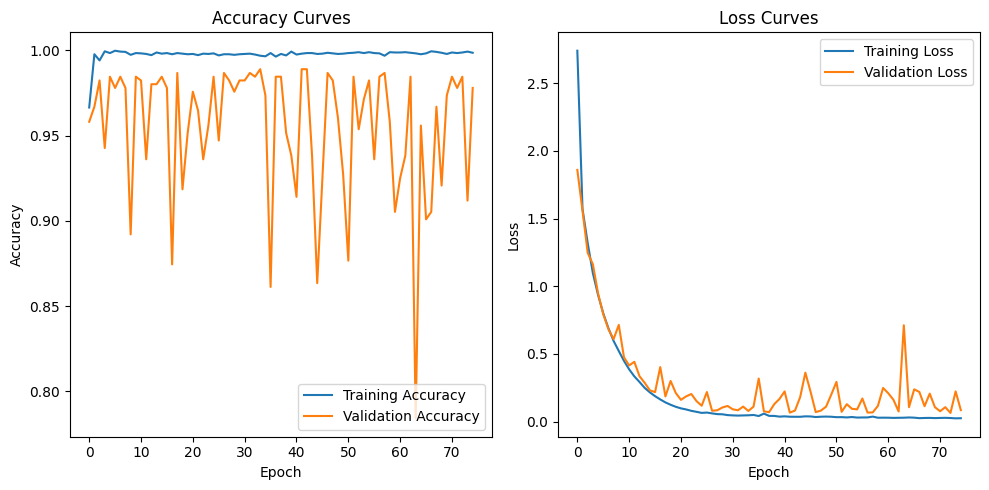

In [ ]:
# prompt: plot accuracy and loss curves

# Plot accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(b_history.history['accuracy'], label='Training Accuracy')
plt.plot(b_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Curves')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(b_history.history['loss'], label='Training Loss')
plt.plot(b_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Loss Curves')

plt.tight_layout()
plt.show()

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


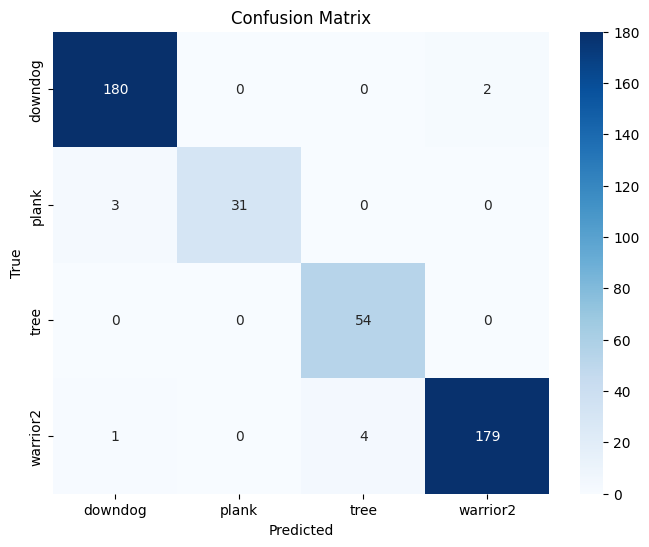

In [ ]:
# prompt: confusion matrix of classification made by the model

# Assuming 'model' is your trained model, 'X_val' is your validation data, and 'y_val_encoded' are your true labels.
# Get predicted classes
predicted_classes = np.argmax(model.predict(X_val), axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(y_val_encoded, predicted_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# prompt: save the model

# Save the model
model.save('yoga_pose_classification_model.h5')

# Download the saved model
from google.colab import files
files.download('yoga_pose_classification_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###Functional API

In [ ]:
# Convert y_train and y_val to numerical labels using LabelEncoder
X_train = combined_df.drop('label', axis=1).iloc[:, 99:]
y_train = combined_df['label']
X_val = test_comb_df_.drop('label', axis=1).iloc[: ,99:]
y_val = test_comb_df_['label']



In [ ]:
X_train.shape

(5793, 12)

In [ ]:
X_val.shape

(454, 12)

In [ ]:
# Assuming X_train and X_val are pandas DataFrames
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
X_val = X_val.apply(pd.to_numeric, errors='coerce').fillna(0)


In [ ]:
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)


In [ ]:
X_train = np.array(X_train)
X_val = np.array(X_val)

In [ ]:
# prompt: read image_data_train1.h5 file and save the elments into an array
def read_image_data_from_h5(filename):
  try:
      with h5py.File(filename, 'r') as hf:
          # Assuming the image data is stored under a dataset named 'images'
          # Change 'images' to the actual dataset name if it is different
          if 'images' in hf:
              image_data = np.array(hf['images'])
              print("Image data loaded successfully.")
          else:
              print(f"Dataset 'images' not found in {filename}. Please check the file.")
  except FileNotFoundError:
      print(f"Error: File '{filename}' not found.")
  except Exception as e:
    print(f"An error occurred: {e}")
  return image_data

In [ ]:
train_images.shape

(5793,)

In [ ]:
test_images.shape

(459,)

In [ ]:
# # prompt: save image_data_train1 and image_data_test1 as h5 files

# import h5py

# def save_image_data_to_h5(image_data, filename):
#     with h5py.File(filename, 'w') as hf:
#         hf.create_dataset('images', data=image_data)
#     print(f"Image data saved to {filename}")


# save_image_data_to_h5(image_data_train1, 'image_data_train1(3).h5')
# save_image_data_to_h5(image_data_test1, 'image_data_test1(3).h5')

Image data saved to image_data_train1(3).h5
Image data saved to image_data_test1(3).h5


In [ ]:
filename = 'image_data_train1(3).h5'
image_data_train1 = read_image_data_from_h5(filename)

filename = 'image_data_test1(3).h5'
image_data_test1 = read_image_data_from_h5(filename)

Image data loaded successfully.
Image data loaded successfully.


In [ ]:
# Assuming image_data_train1 and image_data_test1 are defined as NumPy arrays
# Replace with the actual data or convert your image lists to NumPy arrays
image_data_train1 = np.array(image_data_train1) # Convert to numpy array
image_data_test1 = np.array(image_data_test1)


In [ ]:
X_train = X_train.astype(np.float32)
X_val = X_val.astype(np.float32)


scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)


In [ ]:
len(image_data_train1)


5793

In [ ]:
len(image_data_test1)

454

### CNN for images

In [ ]:
# prompt: model conv2d to predict from images

from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, AveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
import tensorflow as tf

# Define the input shape for your images
img_height, img_width, img_channels = 256, 256, 3 # Example: Adjust to your image dimensions

# Input layer
inputs = Input(shape=(img_height, img_width, img_channels))


# Convolutional layers
x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(inputs)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(x)
x = MaxPooling2D((2, 2))(x)


# Flatten the output from convolutional layers
x = Flatten()(x)


# Dense layers
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
outputs = Dense(4, activation='softmax')(x) # Assuming 4 output classes


# Create the model
model = Model(inputs=inputs, outputs=outputs)


# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])


# Print model summary
model.summary()

history = model.fit(
    image_data_train1,
    y_train_encoded,
    batch_size=64,
    epochs=2,
    validation_data=(image_data_test1, y_val_encoded)
)

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_14 (Flatten)                 │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 128)                 │      16,777,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_44 (Dense)                     │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,001,092 (64.85 MB)

 Trainable params: 17,001,092 (64.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/2
91/91 ━━━━━━━━━━━━━━━━━━━━ 1651s 18s/step - accuracy: 0.7561 - loss: 19.6102 - val_accuracy: 0.1586 - val_loss: 28.2932
Epoch 2/2
91/91 ━━━━━━━━━━━━━━━━━━━━ 1661s 18s/step - accuracy: 1.0000 - loss: 3.5198 - val_accuracy: 0.2247 - val_loss: 24.1393


In [ ]:
# Plot accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Curves')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Loss Curves')

plt.tight_layout()
plt.show()

In [ ]:
# prompt: get back the label name from labelEncoder for each class

import numpy as np
from sklearn.preprocessing import LabelEncoder

# Assuming 'y_train' is your original label data (e.g., from your DataFrame)
# and 'label_encoder' is the fitted LabelEncoder from your code.

# Fit LabelEncoder (if you haven't already)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Get the mapping between encoded values and original labels
label_mapping = dict(zip(label_encoder.transform(label_encoder.classes_), label_encoder.classes_))

# Print the mapping
for encoded_value, original_label in label_mapping.items():
    print(f"Encoded value: {encoded_value}, Original label: {original_label}")

# Alternatively, if you have the encoded values and want to get back the original labels:
encoded_values = [0, 1, 2, 3]  # Example encoded values
original_labels = label_encoder.inverse_transform(encoded_values)
print(f"\nOriginal labels corresponding to encoded values {encoded_values}: {original_labels}")

Encoded value: 0, Original label: downdog
Encoded value: 1, Original label: plank
Encoded value: 2, Original label: tree
Encoded value: 3, Original label: warrior2

Original labels corresponding to encoded values [0, 1, 2, 3]: ['downdog' 'plank' 'tree' 'warrior2']


In [ ]:
# prompt: confusion matrix of classification made by the model

# Assuming 'model' is your trained model, 'X_val' is your validation data, and 'y_val_encoded' are your true labels.
# Get predicted classes
predicted_classes = np.argmax(model.predict(image_data_test1), axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(y_val_encoded, predicted_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

###Functional API remaining

In [ ]:
def build_and_train_model(image_data_train1, X_train, y_train_encoded, input_shape, num_classes):
    """
    Builds and trains a functional API deep learning neural network.

    Args:
        train_images (numpy.ndarray): Training images, shape (num_samples, height, width, channels).
        train_data (numpy.ndarray): Additional training data (e.g., keypoints), shape (num_samples, data_features).
        train_labels (numpy.ndarray): Training labels, shape (num_samples, num_classes).
        input_shape (tuple): Shape of the image input (height, width, channels).
        num_classes (int): Number of output classes.

    Returns:
        Model: Trained Keras model.
        History: Training history object.
    """
    # Image input branch
    image_input = Input(shape=input_shape, name="image_input")
    x = Rescaling(1./255)(image_input),  # Add Rescaling layer
    x = Conv2D(32, (3, 3), activation='relu', padding="same")(image_input)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding="same")(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)
    image_branch_output = Dense(128, activation='relu')(x)


    # Additional data input branch
    data_input = Input(shape=(X_train.shape[1],), name="data_input")
    y = Dense(64, activation='relu')(data_input)
    y = Dropout(0.25)(y)
    y = BatchNormalization()(y)
    y = Dense(64, activation='relu')(y)
    y = Dropout(0.25)(y)
    y = BatchNormalization()(y)
    y = Dense(32, activation='relu')(y)
    data_branch_output = Dense(32, activation='relu')(y)

######################################################
    # data_input = Input(shape=(X_train.shape[1],), name="data_input")
    # y = Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l2(0.01)),
    # # tf.keras.layers.Normalization(),
    # y = MaxPooling1D(pool_size=1),
    # y = Conv1D(filters=128, kernel_size=1, activation='relu', kernel_regularizer=l2(0.01)),
    # y = MaxPooling1D(pool_size=1),
    # y = Conv1D(filters=254, kernel_size=1, activation='relu', kernel_regularizer=l2(0.01)),
    # y = MaxPooling1D(pool_size=1),
    # data_branch_output = Dense(32, activation='relu')(y)


    num_classes=4
    # Combine branches
    combined = tf.keras.layers.concatenate([image_branch_output, data_branch_output])
    combined_output = Dense(128, activation='relu')(combined)
    # combined_output = Dropout(0.5)(combined_output)
    final_output = Dense(num_classes, activation='softmax', name="output")(combined_output)

    # Create model
    model = Model(inputs=[image_input, data_input], outputs=final_output)

    # Compile model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Train model
    history = model.fit(
       [image_data_train1, X_train],
        y_train_encoded,
        batch_size=64,
        epochs=10,
        validation_split= 0.2
    )

    return model, history

# Example usage:
# Assume train_images, train_data, train_labels are already prepared
# train_images: shape (num_samples, height, width, channels)
# train_data: shape (num_samples, data_features)
# train_labels: label encoded  #one-hot encoded labels of shape (num_samples, num_classes)
input_shape = (256, 256, 3)
num_classes = 4

model, history = build_and_train_model(image_data_train1, X_train, y_train_encoded, input_shape, num_classes)


In [ ]:
# prompt: plot accuracy and loss curves
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate([image_data_test1, X_val], y_val_encoded)
print(f'Test Accuracy: {test_accuracy:.2f}')


In [ ]:
# prompt: print classification report

from sklearn.metrics import classification_report

# Assuming 'model' is your trained model, 'X_val' is your validation data, and 'y_val_encoded' are your true labels.
# Get predicted classes
predicted_classes = np.argmax(model.predict([image_data_test1, X_val]), axis=1)

# Generate the classification report
report = classification_report(y_val_encoded, predicted_classes, target_names=label_encoder.classes_)
report

In [ ]:
# Plot accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy Curves')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.title('Loss Curves')

plt.tight_layout()
plt.show()

In [ ]:
# prompt: confusion matrix of classification made by the model

# Assuming 'model' is your trained model, 'X_val' is your validation data, and 'y_val_encoded' are your true labels.
# Get predicted classes
predicted_classes = np.argmax(model.predict([image_data_test1, X_val]), axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(y_val_encoded, predicted_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

#Classification of Pose in a video

In [448]:
import mediapipe as mp

####Functions

In [449]:
# prompt: get the angles for all the tuples in the pose_connections list for all the rows in the dataframe data, which has keypoins and add each angle between a pose_connection tuple items as a column

import pandas as pd
import numpy as np

# Assuming 'data' is your DataFrame and 'pose_connections' is your list of tuples
def add_angles_to_dataframe(data, pose_connections):
    def calculate_angle(a, b, c):
        a = np.array(a)
        b = np.array(b)
        c = np.array(c)
        ba = a - b
        bc = c - b
        cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
        angle = np.arccos(cosine_angle)
        return np.degrees(angle)

    for connection in pose_connections:
      #try:
      joint1_name, joint2_name, joint3_name = connection
      x= f'{joint1_name}-{joint2_name}-{joint3_name}_angle'
      data[x] = ''
      for index, row in data.iterrows():
      # Extract values from every 3 columns for the current row
        temp_tuple = ()
        # for i in range(0, len(row), 3):  # Step by 3
        #     try:
        #         temp_tuple = temp_tuple + (tuple(row[i:i+3]),)
                # Assuming your keypoint data is in columns like 'LEFT_SHOULDER_x', 'LEFT_SHOULDER_y', etc.
        joint1 = (row[f'{joint1_name}_x'], row[f'{joint1_name}_y'])
        joint2 = (row[f'{joint2_name}_x'], row[f'{joint2_name}_y'])
        joint3 = (row[f'{joint3_name}_x'], row[f'{joint3_name}_y'])

        # Calculate angles for each row
        angles = []
        #for i in range(len(data)):
        angle = calculate_angle(joint1, joint2, joint3)
        #angles.append(angle)

        data.loc[index, x] = angle

      # except KeyError as e:
      #     print(f"Warning: Could not calculate angle due to missing keypoint: {e}")
      # except Exception as e:
      #     print(f"An error occurred: {e}")
    return data




In [450]:
import numpy as np

# Frame preprocessing function
def preprocess_frame(frame, target_size):
    frame_resized = cv2.resize(frame, target_size)  # Resize to model input size
    frame_normalized = frame_resized / 255.0       # Normalize if your model expects it
    return np.expand_dims(frame_normalized, axis=0)  # Add batch dimension


In [451]:
# Initialize Mediapipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# Function to extract keypoints from an image
# Function to extract keypoints from an image
def extract_keypoints(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)

    keypoints = {}

    if results.pose_landmarks:
        for idx, landmark in enumerate(results.pose_landmarks.landmark):
            keypoints[mp_pose.PoseLandmark(idx).name] = {
                'x': landmark.x,
                'y': landmark.y,
                'z': landmark.z
            }

    return keypoints

# Function to process images from a root directory and its subfolders
def process_images_for_keypoints(frame):
    all_keypoints = []

    # for dirpath, _, filenames in os.walk(root_directory):
    #     # Assume the directory name represents the label
    #     label = os.path.basename(dirpath)

    #     for filename in filenames:

    # if filename.endswith(('.png', '.jpg', '.jpeg')):
        # image_path = os.path.join(dirpath, filename)
    # image = cv2.imread(filename)
    # frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    keypoints = extract_keypoints(frame)

    # Flatten the keypoints for CSV
    keypoint_row = {}
    for landmark_name, coords in keypoints.items():
        keypoint_row[f'{landmark_name}_x'] = coords['x']
        keypoint_row[f'{landmark_name}_y'] = coords['y']
        keypoint_row[f'{landmark_name}_z'] = coords['z']

    all_keypoints.append(keypoint_row)
    df = pd.DataFrame(all_keypoints)

    return df

# Function to save keypoints to CSV
# def save_keypoints_to_df(keypoints):
    # df = pd.DataFrame(keypoints)
    # # df.to_csv(filename, index=False)
    # return df

In [452]:
import cv2
from tensorflow.keras.models import load_model


# Load video
video_path = 'How to do Downward Dog ｜ Adho Mukha Svanasana Tutorial with Dylan Werner [EC7RGJ975iM].mp4'
cap = cv2.VideoCapture(video_path)  # Replace with 0 for webcam

# Load the trained model
model = load_model('yoga_pose_classification_model.h5')


Functions for Pose Confidence Weighting and Aggregate Deviation

In [453]:
# Adjust thresholds based on confidence
def adjust_thresholds_with_confidence(base_thresholds, confidence, confidence_factor=0.5):
    """
    Adjust thresholds based on prediction confidence.

    Parameters:
        base_thresholds (list): List of base thresholds for each angle.
        confidence (float): Prediction confidence (0-1).
        confidence_factor (float): Factor to scale adjustment, lower value means less impact.

    Returns:
        list: Adjusted thresholds.
    """
    adjustment = (1 - confidence) * confidence_factor
    adjusted_thresholds = [t + t * adjustment for t in base_thresholds]
    return adjusted_thresholds


In [454]:
# def calculate_dynamic_deviation(detected_angles, reference_angles, thresholds):
#     deviations = []
#     for detected, reference, threshold in zip(detected_angles, reference_angles['mean'], reference_angles['std']):
#         deviation = abs(detected - reference)
#         normalized_deviation = deviation / (threshold if threshold > 0 else 1)  # Avoid divide-by-zero
#         deviations.append(normalized_deviation)
#     return deviations


In [455]:
  # Define connections for each angle
def angle_connection_fn():
    angle_connections = {
        "Left Knee": [mp_pose.PoseLandmark.LEFT_HIP.value,
                      mp_pose.PoseLandmark.LEFT_KNEE.value,
                      mp_pose.PoseLandmark.LEFT_ANKLE.value],

        "Right Knee": [mp_pose.PoseLandmark.RIGHT_HIP.value,
                      mp_pose.PoseLandmark.RIGHT_KNEE.value,
                      mp_pose.PoseLandmark.RIGHT_ANKLE.value],

        "Left Elbow": [mp_pose.PoseLandmark.LEFT_SHOULDER.value,
                      mp_pose.PoseLandmark.LEFT_ELBOW.value,
                      mp_pose.PoseLandmark.LEFT_WRIST.value],

        "Right Elbow": [mp_pose.PoseLandmark.RIGHT_SHOULDER.value,
                        mp_pose.PoseLandmark.RIGHT_ELBOW.value,
                        mp_pose.PoseLandmark.RIGHT_WRIST.value],

        "Left Shoulder": [mp_pose.PoseLandmark.LEFT_ELBOW.value,
                          mp_pose.PoseLandmark.LEFT_SHOULDER.value,
                          mp_pose.PoseLandmark.LEFT_HIP.value],

        "Right Shoulder": [mp_pose.PoseLandmark.RIGHT_ELBOW.value,
                          mp_pose.PoseLandmark.RIGHT_SHOULDER.value,
                          mp_pose.PoseLandmark.RIGHT_HIP.value],

        "Left Hip": [mp_pose.PoseLandmark.LEFT_SHOULDER.value,
                    mp_pose.PoseLandmark.LEFT_HIP.value,
                    mp_pose.PoseLandmark.LEFT_KNEE.value],

        "Right Hip": [mp_pose.PoseLandmark.RIGHT_SHOULDER.value,
                      mp_pose.PoseLandmark.RIGHT_HIP.value,
                      mp_pose.PoseLandmark.RIGHT_KNEE.value],

        "Left Ankle": [mp_pose.PoseLandmark.LEFT_HIP.value,
                      mp_pose.PoseLandmark.LEFT_ANKLE.value,
                      mp_pose.PoseLandmark.LEFT_FOOT_INDEX.value],

        "Right Ankle": [mp_pose.PoseLandmark.RIGHT_HIP.value,
                        mp_pose.PoseLandmark.RIGHT_ANKLE.value,
                        mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value],
        "Left Wrist": [mp_pose.PoseLandmark.LEFT_ELBOW.value,
                      mp_pose.PoseLandmark.LEFT_WRIST.value,
                      mp_pose.PoseLandmark.LEFT_INDEX.value],
        "Right Wrist": [mp_pose.PoseLandmark.RIGHT_ELBOW.value,
                        mp_pose.PoseLandmark.RIGHT_WRIST.value,
                        mp_pose.PoseLandmark.RIGHT_INDEX.value],

        }
    return angle_connections


In [456]:
# angle_connections= angle_connection_fn()
# angle_connections
another_dict = {'Left Knee': 0, 'Right Knee': 1, 'Left Elbow': 2, 'Right Elbow': 3,
                'Left Shoulder': 4, 'Right Shoulder': 5, 'Left Hip': 6, 'Right Hip': 7,
                'Left Ankle': 8, 'Right Ankle': 9, 'Left Wrist': 10, 'Right Wrist': 11}


In [457]:
# jn
# # joints[jn[0]]
# l = jn[0]
# m = jn[1]
# n = jn[2]
# joints[n]

# # Form the key for accessing the reference angle in reference_angles
# key = (joints[l] + '-' + joints[m] + '-' + joints[n] + '_angle', 'mean')
# key

In [458]:
def calculate_dynamic_deviation(input_angles, reference, adjusted_thresholds):
    """Calculates dynamic deviations."""
    deviations = []

    # Get angle connection names from reference_angles for the predicted pose
    angle_connections = [tuple(a.split('-')) for a in combined_df.columns[100:]] # Corrected: Assuming angle connection names are in the first 12 columns

    # Iterate over angle connections
    for i, angle_conn in enumerate(angle_connections):
        angle_name = angle_conn[0] + '-' + angle_conn[1] + '-' + angle_conn[2]

        # Access reference values using the angle name
        reference_mean = reference[(angle_name, 'mean')]
        reference_std = reference[(angle_name, 'std')]

        # Get the angle value from input_angles using indexing with i
        angle_value = input_angles[0, 0, i]  # Get the value from input_angles

        # Calculate deviation
        deviation = abs(angle_value - reference_mean) / reference_std
        deviations.append(deviation)

    return deviations

In [473]:
for i in range(0,12):
         keys_with_value= [key for key, value in another_dict.items() if value == i]
         print(keys_with_value)

['Left Knee']
['Right Knee']
['Left Elbow']
['Right Elbow']
['Left Shoulder']
['Right Shoulder']
['Left Hip']
['Right Hip']
['Left Ankle']
['Right Ankle']
['Left Wrist']
['Right Wrist']


In [459]:
# def calculate_dynamic_deviation(detected_angles, reference_angles, thresholds):
#     deviations = {}

#     for i, (detected, threshold) in enumerate(zip(detected_angles[0][0], thresholds)):
#         # Get the correct angle connection for this iteration
#         keys_with_value= [key for key, value in another_dict.items() if value == i]
#         angle_connections = angle_connection_fn()
#         angle_conn = angle_connections[keys_with_value[0]]
#         jn = angle_conn
#         l = jn[0]
#         m = jn[1]
#         n = jn[2]
#         joints[n]

#         # Form the key for accessing the reference angle in reference_angles
#         key = (joints[l] + '-' + joints[m] + '-' + joints[n] + '_angle', 'mean')

#         # Get the reference angle
#         reference = reference_angles.get(key, 0)  # Use get with a default value to handle potential missing keys

#         # Calculate and append the deviation
#         deviation = abs(detected - reference)
#         normalized_deviation = deviation / (threshold if threshold > 0 else 1)
#         # deviations.append(normalized_deviation)
#         deviations[keys_with_value[0]] = normalized_deviation

#     return deviations

In [460]:
# def calculate_aggregate_deviation(deviations):
#   """
#   Calculates the mean deviation score from a list or dictionary of deviations.

#   Args:
#       deviations: A list or dictionary of deviation values.

#   Returns:
#       float: Mean deviation score.
#   """
#   # Check if deviations is not empty and contains any values
#   if deviations and any(deviations.values()):
#       # Filter out non-numeric values and convert to float
#       numeric_deviations = [float(value) for value in deviations.values() if isinstance(value, (int, float))]

#       # Calculate mean deviation only if there are numeric values
#       return sum(numeric_deviations) / len(numeric_deviations) if numeric_deviations else 0.0
#   else:
#       return 0.0  # Return 0 if deviations is empty or contains no values

In [461]:
# Calculate aggregate deviation
def calculate_aggregate_deviation(deviations):
    """
    Calculate the overall deviation score for a pose.

    Parameters:
        deviations (list): List of normalized deviations.

    Returns:
        float: Mean deviation score.
    """
    return sum(deviations) / len(deviations) if deviations else 0.0

Reference angles(mean, std) for each pose

In [462]:
import pandas as pd


# Group by pose label and calculate mean and std
reference_angles = combined_df.groupby('label').agg(['mean', 'std']).to_dict('index')

# Result: Dictionary with mean and std for each pose
print(reference_angles)


{'downdog': {('NOSE_x', 'mean'): 0.49270870618110957, ('NOSE_x', 'std'): 0.0341027684423503, ('NOSE_y', 'mean'): 0.627295608884046, ('NOSE_y', 'std'): 0.015153489328618852, ('NOSE_z', 'mean'): -0.009608626964229934, ('NOSE_z', 'std'): 0.08587964903887871, ('LEFT_EYE_INNER_x', 'mean'): 0.49032170283002646, ('LEFT_EYE_INNER_x', 'std'): 0.04162554042115702, ('LEFT_EYE_INNER_y', 'mean'): 0.6361645060348332, ('LEFT_EYE_INNER_y', 'std'): 0.01655450232666192, ('LEFT_EYE_INNER_z', 'mean'): -0.027042334786298253, ('LEFT_EYE_INNER_z', 'std'): 0.0951995248838412, ('LEFT_EYE_x', 'mean'): 0.4904733390396616, ('LEFT_EYE_x', 'std'): 0.043108424994309294, ('LEFT_EYE_y', 'mean'): 0.6354385661510132, ('LEFT_EYE_y', 'std'): 0.016598604149050258, ('LEFT_EYE_z', 'mean'): -0.027014285000561866, ('LEFT_EYE_z', 'std'): 0.09517527361347092, ('LEFT_EYE_OUTER_x', 'mean'): 0.49071201268092174, ('LEFT_EYE_OUTER_x', 'std'): 0.04465659728869295, ('LEFT_EYE_OUTER_y', 'mean'): 0.6344728174055705, ('LEFT_EYE_OUTER_y', 

In [463]:
reference_angles['downdog'] = dict(list(reference_angles['downdog'].items())[198:])
reference_angles['plank'] = dict(list(reference_angles['plank'].items())[198:])
reference_angles['tree'] = dict(list(reference_angles['tree'].items())[198:])
reference_angles['warrior2'] = dict(list(reference_angles['warrior2'].items())[198:])

In [464]:
print(reference_angles)


{'downdog': {('RIGHT_SHOULDER-RIGHT_ELBOW-RIGHT_PINKY_angle', 'mean'): 157.98966460377792, ('RIGHT_SHOULDER-RIGHT_ELBOW-RIGHT_PINKY_angle', 'std'): 23.305367975447304, ('LEFT_ELBOW-LEFT_WRIST-LEFT_PINKY_angle', 'mean'): 155.33217976758752, ('LEFT_ELBOW-LEFT_WRIST-LEFT_PINKY_angle', 'std'): 23.38142173874489, ('MOUTH_RIGHT-RIGHT_SHOULDER-RIGHT_ELBOW_angle', 'mean'): 45.50045445740647, ('MOUTH_RIGHT-RIGHT_SHOULDER-RIGHT_ELBOW_angle', 'std'): 20.019874674142518, ('LEFT_SHOULDER-LEFT_ELBOW-LEFT_WRIST_angle', 'mean'): 161.86967525062394, ('LEFT_SHOULDER-LEFT_ELBOW-LEFT_WRIST_angle', 'std'): 26.772047156744414, ('RIGHT_SHOULDER-MOUTH_RIGHT-RIGHT_THUMB_angle', 'mean'): 111.24164443493986, ('RIGHT_SHOULDER-MOUTH_RIGHT-RIGHT_THUMB_angle', 'std'): 24.974293212777667, ('LEFT_ELBOW-LEFT_SHOULDER-RIGHT_HIP_angle', 'mean'): 169.37478981118454, ('LEFT_ELBOW-LEFT_SHOULDER-RIGHT_HIP_angle', 'std'): 10.750896997114015, ('RIGHT_THUMB-RIGHT_HIP-RIGHT_KNEE_angle', 'mean'): 53.36448137874485, ('RIGHT_THUMB-

In [465]:
if X_train.shape[0]>=1 and X_train.shape[1]>=1:
  print("not empty")

not empty


####Annotating

In [466]:
# keypoint assignment to various joints in mediapipe

joints = []
for i in range(33):  # 33 is the total number of pose landmarks in MediaPipe
  # print(f"{i}: {mp_pose.PoseLandmark(i).name}")
  joints.append(mp_pose.PoseLandmark(i).name)

In [467]:
# for angle_name, connection in angle_connections.items():
#     # Get joint indices
#     joint1_idx, joint2_idx, joint3_idx = connection
#     # h, w, _ = frame.shape
#     # Get coordinates of the joints
#     joint1 = (combined_df.loc[0,f'{joints[joint1_idx]}_x'], combined_df.loc[0,f'{joints[joint1_idx]}_y'])
#     joint2 = (combined_df.loc[0,f'{joints[joint2_idx]}_x'], combined_df.loc[0,f'{joints[joint2_idx]}_y'])
#     joint3 = (combined_df.loc[0,f'{joints[joint3_idx]}_x'], combined_df.loc[0,f'{joints[joint3_idx]}_x'])
#     print(joint1)



In [468]:
font = cv2.FONT_HERSHEY_PLAIN  # Compact font
font_scale = 1  # Smaller font size
thickness = 1  # Reduced thickness
line_height = 15  # Vertical spacing between lines

# Start annotation position
start_x = 10
start_y = 30

In [ ]:
# Define VideoWriter to save annotated video
out = cv2.VideoWriter('output_video.avi', cv2.VideoWriter_fourcc(*'XVID'),
                      cap.get(cv2.CAP_PROP_FPS), (int(cap.get(3)), int(cap.get(4))))

# pose_labels = ['warrior2', 'plank', 'downdog', 'tree']  # Replace with your pose labels
CONFIDENCE_THRESHOLD = 0.99

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    keypoints_df = process_images_for_keypoints(frame)
    # print(keypoints_df)

    if not keypoints_df.empty:

    # Calculate angles from keypoints
      input_angles_with_keypoints = add_angles_to_dataframe(keypoints_df, pose_connections)
      input_angles= input_angles_with_keypoints.iloc[:, 99:]
      input_angles = input_angles.astype('float32') # Convert to float32
      input_angles = input_angles.values.reshape(input_angles.shape[0], 1, input_angles.shape[1])
      # Preprocess and predict
      # input_frame = preprocess_frame(frame, target_size=(224, 224))
      prediction = model.predict(input_angles)
      max_confidence = np.max(prediction)  # Highest confidence score
      # predicted_class = np.argmax(prediction, axis=1)[0]

      predicted_class_index = np.argmax(prediction)
      my_dict = {0: "downdog", 1: "plank", 2: "tree", 3: "warrior2"}
      pose_label = my_dict[predicted_class_index]

    #   # Check confidence threshold
    #   if max_confidence < CONFIDENCE_THRESHOLD:
    #       pose_label = "No pose detected"
    #   else:
    #       pose_label = my_dict[predicted_class_index]

    #   # Annotate frame with pose label
    #   cv2.putText(frame, f"Pose: {pose_label}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
    #               1, (255, 0, 0), 2, cv2.LINE_AA)
    #   mp_drawing.draw_landmarks(frame, pose.process(frame).pose_landmarks, mp_pose.POSE_CONNECTIONS)

    # else:
    #     # No keypoints detected
    #     cv2.putText(frame, "No pose detected", (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
    #                 1, (0, 0, 255), 2, cv2.LINE_AA)

      if max_confidence >= CONFIDENCE_THRESHOLD:
          pose_label = my_dict[predicted_class_index]

          # Retrieve reference angles and thresholds for the predicted pose

          reference = reference_angles[pose_label]

          # base_thresholds = reference['std']
          # print("Input angles", input_angles)
          # print("Reference angles", reference)

          # Get angle connections from the reference_angles dictionary for the specific pose
          # angle_connections = [angle_conn for angle_conn, _ in reference if _ == 'mean']
          # print("Angle connections", angle_connections)
          angle_connections = [tuple(a.split('-')) for a in combined_df.columns[100:]]  # Corrected: Assuming angle connection names are in the first 12 columns
          # print("Angle connections", angle_connections)

          # Calculate standard deviations for each angle
          base_thresholds = [reference[(angle_conn[0] + '-' + angle_conn[1] + '-' + angle_conn[2], 'std')] for angle_conn in angle_connections]
          # print("Base thresholds", base_thresholds)
          # Adjust thresholds based on confidence
          adjusted_thresholds = adjust_thresholds_with_confidence(base_thresholds, max_confidence)
          # print("Adjusted thresholds", adjusted_thresholds)

          # Calculate deviations
          deviations = calculate_dynamic_deviation(input_angles, reference, adjusted_thresholds)
          # deviations = calculate_dynamic_deviation(np.array(input_angles).flatten(), reference, adjusted_thresholds)
          # print("Deviations", deviations)
          # Calculate aggregate deviation
          overall_deviation = calculate_aggregate_deviation(deviations)

          # Annotate pose and deviations
          cv2.putText(frame, f"Pose: {pose_label} (Confidence: {max_confidence:.2f})", (10, 30),
                      font, font_scale, (255, 0, 0), 1, cv2.LINE_AA)
###################################################
          # angle_connections= angle_connection_fn()
          # for angle_name, connection in angle_connections.items():
          #     # Get joint indices
          #     joint1_idx, joint2_idx, joint3_idx = connection
          #     h, w, _ = frame.shape
          #     # Get coordinates of the joints
          #     joint1 = (int(combined_df.loc[0,f'{joints[joint1_idx]}_x']*w), int(combined_df.loc[0,f'{joints[joint1_idx]}_y']*h))
          #     joint2 = (int(combined_df.loc[0,f'{joints[joint2_idx]}_x']*w), int(combined_df.loc[0,f'{joints[joint2_idx]}_y']*h))
          #     joint3 = (int(combined_df.loc[0,f'{joints[joint3_idx]}_x']*w), int(combined_df.loc[0,f'{joints[joint3_idx]}_x']*h))
          #     # Draw lines between joints
          #     cv2.line(frame, joint1, joint2, (255, 255, 255), 2)  # Line 1
          #     cv2.line(frame, joint2, joint3, (255, 255, 255), 2)  # Line 2

          #     # Annotate deviation and angle name
          #     text_position = (joint2[0] + 10, joint2[1] - 10)
          #     deviation = deviations.get(angle_name, 0.0)  # Retrieve deviation for this angle
          #     color = (0, 255, 0)  # Default Green
          #     if deviation > 1.5:
          #         color = (0, 0, 255)  # Red for high deviation
          #     elif deviation > 1.0:
          #         color = (0, 255, 255)  # Yellow for moderate deviation

          #     # Annotate angle name and deviation
          #     cv2.putText(frame, f"{angle_name}: {deviation:.2f}x std", text_position,
          #                 cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
########################################
          for i, deviation in enumerate(deviations):
              color = (0, 255, 0)  # Green
              if deviation > 1.5:  # Beyond 1.5x std
                  color = (0, 0, 255)  # Red
              elif deviation > 1.0:  # Between 1.0x and 1.5x std
                  color = (0, 255, 255)  # Yellow

              y_position = start_y + (i + 1) * line_height
              ang= [key for key, value in another_dict.items() if value == i]

              cv2.putText(frame, f"{ang[0]} deviation: {deviation:.2f}x std",
                          (start_x, y_position), font, font_scale, color, 1, cv2.LINE_AA)
############################################
          # Display overall deviation score
          overall_y_position = start_y + (len(deviations) + 1) * line_height
          cv2.putText(frame, f"Overall Deviation: {overall_deviation:.2f}",
                      (start_x, overall_y_position), font, font_scale, (0, 255, 255), 1, cv2.LINE_AA)
        #   mp_drawing.draw_landmarks(frame, pose.process(frame).pose_landmarks, mp_pose.POSE_CONNECTIONS)


      else:
          cv2.putText(frame, "No pose detected", (10, 30),cv2.FONT_HERSHEY_SIMPLEX,
                      1, (0, 0, 255), 2, cv2.LINE_AA)


    else:
        cv2.putText(frame, "No pose detected", (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
                    1, (0, 0, 255), 2, cv2.LINE_AA)
    # Save the annotated frame
    out.write(frame)


cap.release()
out.release()
pose.close()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

In [ ]:
from IPython.display import HTML
from base64 import b64encode

# Convert video to displayable format
video_path = 'output_video.avi'
video_html = f"""
<video width="640" height="480" controls>
  <source src="data:video/mp4;base64,{b64encode(open(video_path, 'rb').read()).decode()}">
</video>
"""
HTML(video_html)


#Trial to include scaled keypoints for each frame

In [ ]:
#Example Usage
image_paths = ["downdog_ideal.jpg"]
ideal_keypoints = extract_ideal(image_paths)

In [ ]:
#Example Usage
image_paths = ["downdog_detected.png"]
detected_keypoints = extract_ideal(image_paths)

In [ ]:
#Example Usage
image_paths = ["downdog_detected2.jpg"]
detected_keypoints = extract_ideal(image_paths)

In [ ]:
# Convert keypoint values to a list of lists
k_list = [list(coords) for coords in ideal_keypoints.values()]

# Convert the list of lists to a NumPy array
k_array = np.array(k_list)

# Check if the array is empty
if k_array.size == 0:
    raise ValueError("Keypoints array is empty. Cannot calculate mean.")

# 1. Find the center of the body (mean of all keypoints)
# center = np.mean(keypoints_array[:, :2], axis=0)  # [cx, cy] # Only use x, y coordinates
left_hip_idx = 23
right_hip_idx = 24
c = (k_array[left_hip_idx, :2] + k_array[right_hip_idx, :2]) / 2


In [ ]:
# Convert keypoint values to a list of lists
p_list = [list(coords) for coords in detected_keypoints.values()]

# Convert the list of lists to a NumPy array
p_array = np.array(k_list)


In [ ]:
import numpy as np

def preprocess_keypoints(keypoints):
    keypoint_list = [list(coords) for coords in keypoints.values()]      # Convert keypoint values to a list of lists
    keypoints_array = np.array(keypoint_list)     # Convert the list of lists to a NumPy array

    # Check if the array is empty
    if keypoints_array.size == 0:
        raise ValueError("Keypoints array is empty. Cannot calculate mean.")

    # 1. Find the center of the body (mean of all keypoints)
    left_hip_idx = 23
    right_hip_idx = 24
    center = c
    # center = (keypoints_array[left_hip_idx, :2] + keypoints_array[right_hip_idx, :2]) / 2

    # 2. Calculate distances of each keypoint from the center
    distances = keypoints_array[:, :3] - center  # Shape: (num_keypoints, 2) # Only use x, y coordinates

    # 3. Compute pose size (e.g., using Frobenius norm of distances matrix)
    pose_size = np.linalg.norm(distances)  # Single scalar value

    # Avoid division by zero in case of a degenerate pose
    if pose_size == 0:
        pose_size = 1e-6

    # Scale distances by pose size (normalize keypoints)
    normalized_keypoints = distances / pose_size

    # 4. Center the pose at the origin (done implicitly by subtracting `center` above)

    # 5. Flatten the keypoints into a 1D vector
    #flattened_keypoints = normalized_keypoints.flatten()

    return normalized_keypoints

In [ ]:
detected_keypoints_array = preprocess_keypoints(detected_keypoints)
ideal_keypoints_array = preprocess_keypoints(ideal_keypoints)

In [ ]:
# prompt: get a similarity score for detected_keypoints_array and ideal_keypoints_array

import numpy as np

def calculate_similarity(ideal_keypoints_arr, detected_keypoints_arr):
    """
    Calculates the similarity score between two sets of keypoints.

    Args:
        detected_keypoints_array (numpy.ndarray): Array of detected keypoints.
        ideal_keypoints_array (numpy.ndarray): Array of ideal keypoints.

    Returns:
        float: Similarity score between 0 and 1.
    """

    # Check if arrays have the same shape
    if detected_keypoints_arr.shape != ideal_keypoints_arr.shape:
        raise ValueError("Keypoints arrays must have the same shape.")

    # Calculate the Mean Squared Error (MSE) between the keypoint coordinates
    mse = np.mean((detected_keypoints_arr - ideal_keypoints_arr)**2)

    # Calculate the similarity score (inverse of MSE, scaled to be between 0 and 1)
    # Assuming maximum possible MSE is 4 (maximum difference in coordinates is 2)
    similarity_score = 1 / (1 + mse) #  Scaling factor for better range

    return similarity_score


# Example usage:
# Assuming detected_keypoints_array and ideal_keypoints_array are defined as in the provided code

similarity = calculate_similarity(k_array, p_array)
print(f"Similarity score: {similarity}")

Similarity score: 1.0


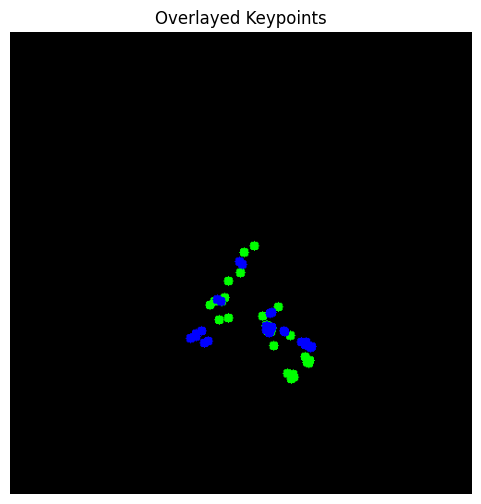

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# First set of keypoints
keypoints1 = detected_keypoints_array

# Second set of keypoints (same as the first set for demonstration, replace with your data)
keypoints2 = ideal_keypoints_array # Adding a small offset for demonstration

# Function to process and scale keypoints for visualization
# def process_keypoints(keypoints, center_body, scale_factor, canvas_size):
#     adjusted_keypoints = keypoints - center_body
#     scaled_keypoints = adjusted_keypoints * scale_factor
#     x_coords = scaled_keypoints[:, 0] + canvas_size // 2
#     y_coords = scaled_keypoints[:, 1] + canvas_size // 2
#     return np.clip(x_coords, 0, canvas_size - 1), np.clip(y_coords, 0, canvas_size - 1)
def process_keypoints(keypoints, scale_factor, canvas_size):
    scaled_keypoints = keypoints * scale_factor
    x_coords = scaled_keypoints[:, 0] + canvas_size // 2
    y_coords = scaled_keypoints[:, 1] + canvas_size // 2
    return np.clip(x_coords, 0, canvas_size - 1), np.clip(y_coords, 0, canvas_size - 1)

# # Indices for left and right hip
# left_hip_idx = 23  # Example, modify as per your dataset
# right_hip_idx = 24

# # Calculate the center of the body (midpoint of left and right hip) for both sets
# center_body1 = (keypoints1[left_hip_idx] + keypoints1[right_hip_idx]) / 2
# center_body2 = (keypoints2[left_hip_idx] + keypoints2[right_hip_idx]) / 2

# Canvas settings
canvas_size = 500
scale_factor = 500

# Process both sets of keypoints
x1, y1 = process_keypoints(keypoints1, scale_factor, canvas_size)
x2, y2 = process_keypoints(keypoints2, scale_factor, canvas_size)

# Create a blank canvas
canvas = np.zeros((canvas_size, canvas_size, 3), dtype=np.uint8)

# Plot first set of keypoints (green)
for x, y in zip(x1, y1):
    cv2.circle(canvas, (int(x), int(y)), radius=5, color=(0, 255, 0), thickness=-1)

# Plot second set of keypoints (blue)
for x, y in zip(x2, y2):
    cv2.circle(canvas, (int(x), int(y)), radius=5, color=(255, 0, 0), thickness=-1)

# Display the result
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for Matplotlib
plt.title("Overlayed Keypoints")
plt.axis("off")
plt.show()
